In [39]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import load_digits
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn import metrics
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.mixture import GaussianMixture
import umap

This data set consists of images of the numbers 0-9. The images are 8x8 and they are gray scale. Let's see if we can use unsupervised learning models to help identify the different numbers.

In [2]:
digits = load_digits()

In [3]:
X = digits['data']
y = digits['target']

In [4]:
X_std = StandardScaler().fit_transform(X)

# PCA

In [5]:
pca = PCA(n_components=2)

X_pca = pca.fit_transform(X_std)

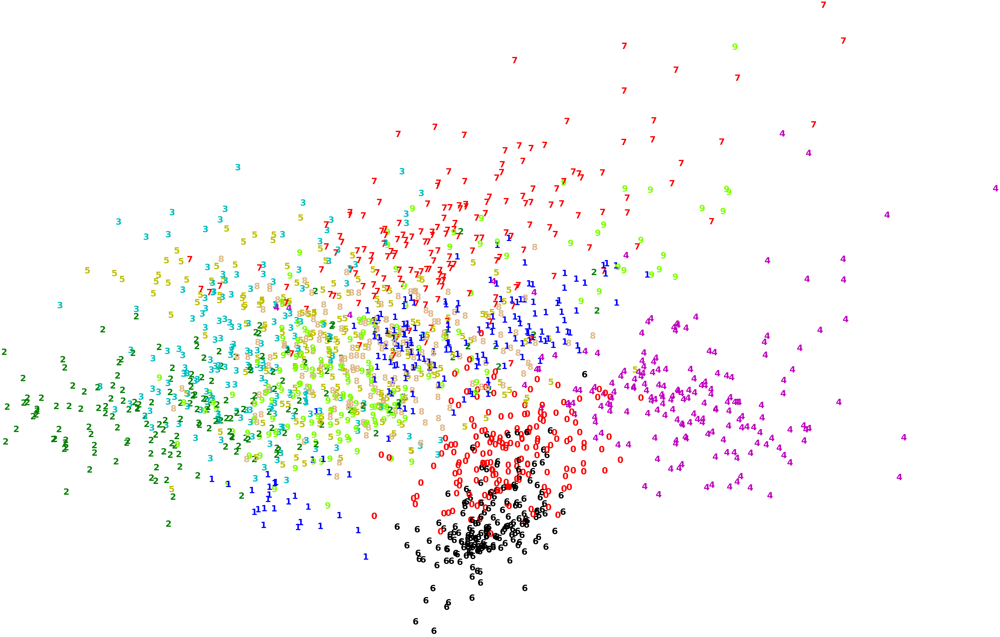

In [6]:
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], y[i],
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50})

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

# t-SNE

In [36]:
tsne = TSNE(n_components=2, verbose=1, perplexity=50, n_iter=500)

X_tsne = tsne.fit_transform(X_std)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 1797 samples in 0.009s...
[t-SNE] Computed neighbors for 1797 samples in 0.345s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1797
[t-SNE] Computed conditional probabilities for sample 1797 / 1797
[t-SNE] Mean sigma: 2.670628
[t-SNE] KL divergence after 250 iterations with early exaggeration: 64.996788
[t-SNE] KL divergence after 500 iterations: 0.787904


In [37]:
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_tsne.shape[0]):
    plt.text(X_tsne[i, 0], X_tsne[i, 1], y[i],
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 400})

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

# UMAP reduction

In [9]:
X_umap = umap.UMAP(n_neighbors=7, min_dist=0.25, metric='correlation').fit_transform(X_std)

In [10]:
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_umap.shape[0]):
    plt.text(X_umap[i, 0], X_umap[i, 1], y[i],
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 100})

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

# K-means clustering

In [55]:
k_means = KMeans(n_clusters=10, random_state=200)
y_preds = k_means.fit_predict(X_std)

In [56]:
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_umap.shape[0]):
    plt.text(X_umap[i, 0], X_umap[i, 1], y_preds[i],
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 100})

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [57]:
print('ARI score (k_means): {}'.format(metrics.adjusted_rand_score(y,y_preds)))
print('Silhouette score (k_means): {}'.format(metrics.silhouette_score(X_std,y_preds)))

ARI score (k_means): 0.47934531351547444
Silhouette score (k_means): 0.14436781873171164


# Heirarchical agglomerative clustering

In [34]:
agg_clus = AgglomerativeClustering(linkage='ward', affinity='euclidean', n_clusters=10)
y_preds = agg_clus.fit_predict(X_std)

In [30]:
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_umap.shape[0]):
    plt.text(X_umap[i, 0], X_umap[i, 1], y_preds[i],
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 100})

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [31]:
print('ARI score (agglomerative): {}'.format(metrics.adjusted_rand_score(y,y_preds)))
print('Silhouette score (agglomerative): {}'.format(metrics.silhouette_score(X_std,y_preds)))

ARI score (agglomerative): 0.6643458356002893
Silhouette score (agglomerative): 0.12532527779196984


# DBSCAN

In [32]:
dbscan = DBSCAN(eps=4, min_samples=3)
y_preds = dbscan.fit_predict(X_std)

In [18]:
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_umap.shape[0]):
    plt.text(X_umap[i, 0], X_umap[i, 1], y_preds[i],
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 100})

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [19]:
print('ARI score (DBSCAN): {}'.format(metrics.adjusted_rand_score(y,y_preds)))
print('Silhouette score (DBSCAN): {}'.format(metrics.silhouette_score(X_std,y_preds)))

ARI score (DBSCAN): 0.3018817840419788
Silhouette score (DBSCAN): -0.0969711462382378


# Gaussian Mixture Model

In [52]:
# Defining the agglomerative clustering
gmm = GaussianMixture(n_components=10, random_state=200, covariance_type='full')

# Fit model
y_preds = gmm.fit_predict(X_std)

In [53]:
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(X_umap.shape[0]):
    plt.text(X_umap[i, 0], X_umap[i, 1], y_preds[i],
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 100})

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [54]:
print('ARI score (GMM): {}'.format(metrics.adjusted_rand_score(y,y_preds)))
print('Silhouette score (GMM): {}'.format(metrics.silhouette_score(X_std,y_preds)))

ARI score (GMM): 0.46364761810610094
Silhouette score (GMM): 0.13282339301937787


# Summary

- The heirarchical agglomerative model had the highest ARI score of 0.664.
- The K-means model had the highest silhouette score of 0.144, however this was only slightly higher than the heirarchical agglomerative model. Therefore, I would say the heirarchical agglomerative model performed the best.
- The dimensionality reductions techniques allowed to visualize the data in two dimensions, even though there were 64 columns in our data set. This allowed us to gain insights that there should be around 10 clusters. This is extremely useful when we don't know the target variable, and it is much more difficult to estimate the number of clusters.